Here the colab link to a more interactive approach: https://colab.research.google.com/drive/1hSNGj9ijI_gXV_jMfzAWyHchObsJsfk1?usp=sharing

# Hystogram

First I want to study how to visualize an is histogram of HSV channels for any image:

https://stackoverflow.com/questions/72739316/plotting-hsv-channel-histograms-from-a-bgr-image-opencv

https://www.geeksforgeeks.org/python-opencv-cv2-calchist-method/

https://docs.opencv.org/3.4/d8/dbc/tutorial_histogram_calculation.html

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def plot_hsv_histograms(image_path):
  image = cv2.imread(image_path)

  hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
  rgb_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  # Calculate histograms for H, S, and V channels
  h_hist = cv2.calcHist([hsv_image], [0], None, [180], [0, 180])
  s_hist = cv2.calcHist([hsv_image], [1], None, [256], [0, 256])
  v_hist = cv2.calcHist([hsv_image], [2], None, [256], [0, 256])

  plt.figure(figsize=(10, 6 ))

  # Display the original image
  plt.subplot(4, 1, 1)
  plt.imshow(rgb_image)
  plt.title('Original Image')
  plt.axis('off')

  # H channel histogram
  plt.subplot(4, 1, 2)
  plt.plot(h_hist, color='r')
  plt.title('Hue Histogram')
  plt.xlim([0, 180])

  # S channel histogram
  plt.subplot(4, 1, 3)
  plt.plot(s_hist, color='g')
  plt.title('Saturation Histogram')
  plt.xlim([0, 256])

  # V channel histogram
  plt.subplot(4, 1, 4)
  plt.plot(v_hist, color='b')
  plt.title('Value Histogram')
  plt.xlim([0, 256])

  plt.subplots_adjust(hspace=0.4)

  plt.tight_layout()
  plt.show()

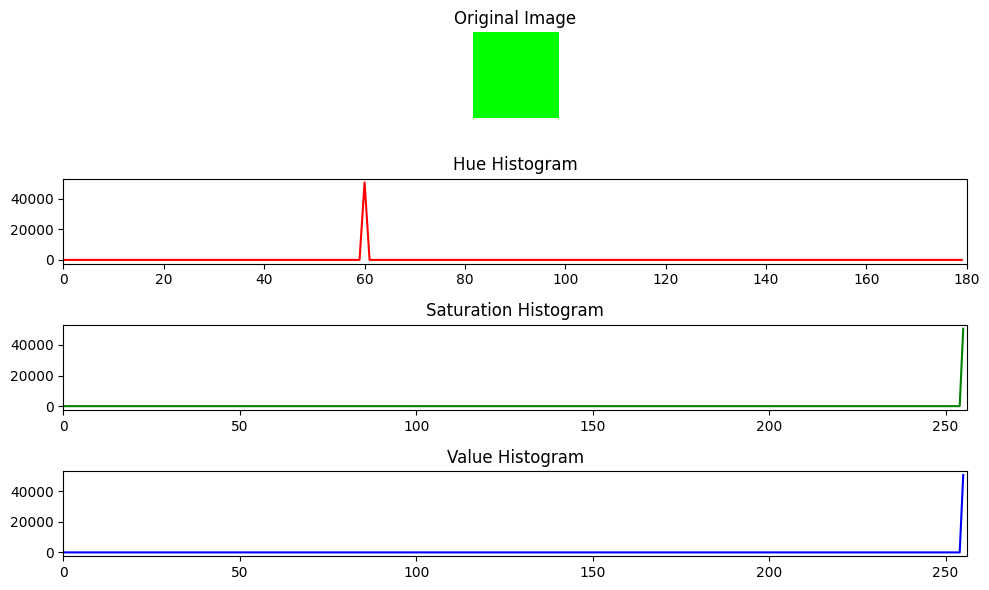

In [6]:
plot_hsv_histograms('/content/green.png')

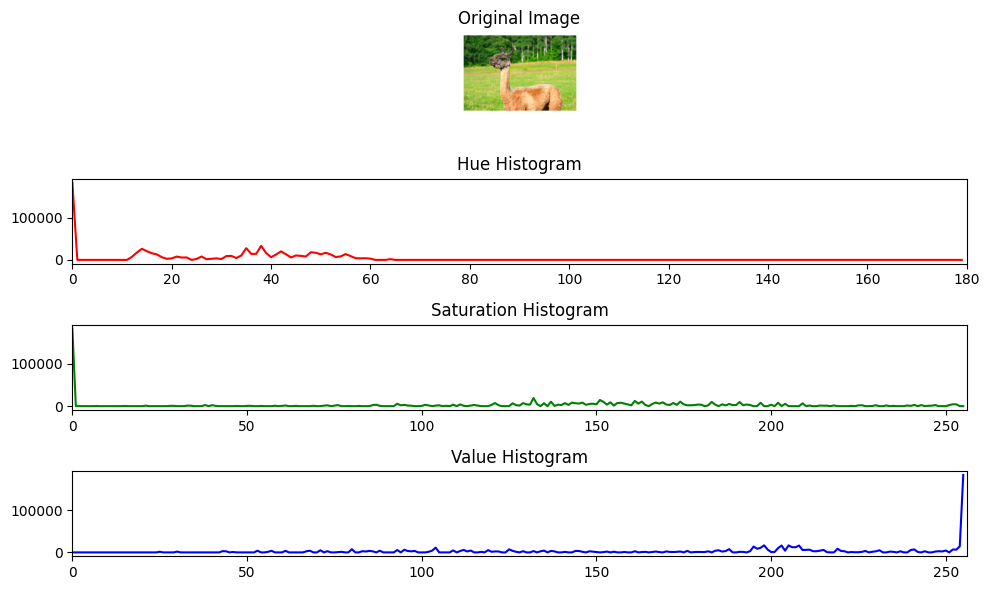

In [4]:
plot_hsv_histograms('/content/lama.png')

In [ ]:
plot_hsv_histograms('/content/train_000000529096.jpg')

# Color Limits

I defined my colors limits as 2 arrays of 3 values, defining a cube of possible values in a 3D space (using HSV colorspace)

In [11]:
color_limits = {
    'red': [np.array([0,70,150]), np.array([4.4,255,255])],
    'red2': [np.array([175,110,140]), np.array([179,255,255])],
    'green': [np.array([40,70,117.3]), np.array([75,255,255])],
    'blue': [np.array([108,70,70]), np.array([121,255,255])],
    'cyan': [np.array([88.5,70,156]), np.array([105,255,255])],
    'orange': [np.array([12,70,210]), np.array([19,255,255])],
    'purple': [np.array([137,70,84]), np.array([142,255,255])],
    'pink': [np.array([155,70,170]), np.array([165,200,255])],
    'brown': [np.array([15,40,60]), np.array([19,255,147.9])],
    'yellow': [np.array([28.5,70,190]), np.array([32,255,255])],
    'black': [np.array([0,0,0]), np.array([179,255,20])],
    'white': [np.array([0,0,200]), np.array([179,15,255])],
    'gray': [np.array([0,0,40]), np.array([179,15,190])]
}

In [12]:
print(color_limits['red'][0][2])

150


Here I try to visualize it:

In [13]:
import matplotlib.colors as mcolors
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

def plot_ranges(color_limits, display_mode, elev=30, azim=-60):
    fig, ax = plt.subplots(figsize=(12, 12), subplot_kw={'projection': '3d'})

    ax.set_title("Color Ranges Visualization")
    ax.set_xlabel('Hue')
    ax.set_ylabel('Saturation')
    ax.set_zlabel('Value')

    ax.set_xlim([0, 179])
    ax.set_ylim([0, 255])
    ax.set_zlim([0, 255])

    if display_mode == 'scatter':
        for color_name, (low, high) in color_limits.items():
            h_range = np.linspace(low[0], high[0], 10)
            s_range = np.linspace(low[1], high[1], 10)
            v_range = np.linspace(low[2], high[2], 10)
            h, s, v = np.meshgrid(h_range, s_range, v_range, indexing='ij')
            hsv_color = np.stack([h, s, v], axis=-1)
            rgb_color = mcolors.hsv_to_rgb(hsv_color / [179, 255, 255])
            ax.scatter(h.flatten(), s.flatten(), v.flatten(), c=rgb_color.reshape(-1, 3), marker='o', s=20, label=color_name)

    if display_mode == 'cubes':
        for color_name, (low, high) in color_limits.items():
            h = [low[0], high[0]]
            s = [low[1], high[1]]
            v = [low[2], high[2]]

            vertices = np.array([[h[0], s[0], v[0]], [h[1], s[0], v[0]],
                                 [h[1], s[1], v[0]], [h[0], s[1], v[0]],
                                 [h[0], s[0], v[1]], [h[1], s[0], v[1]],
                                 [h[1], s[1], v[1]], [h[0], s[1], v[1]]])

            faces = [[vertices[j] for j in [0, 1, 2, 3]], [vertices[j] for j in [4, 5, 6, 7]],
                     [vertices[j] for j in [0, 1, 5, 4]], [vertices[j] for j in [2, 3, 7, 6]],
                     [vertices[j] for j in [1, 2, 6, 5]], [vertices[j] for j in [4, 7, 3, 0]]]

            # The color is the mean value of the limits, not a gradient
            hsv_avg = np.mean(np.array([low, high]), axis=0) / [179, 255, 255]
            color_rgb = mcolors.hsv_to_rgb(hsv_avg)

            ax.add_collection3d(Poly3DCollection(faces, facecolors=color_rgb, linewidths=0.5, edgecolors='k', alpha=0.7))

    ax.view_init(elev=elev, azim=azim)
    #ax.legend()
    plt.show()

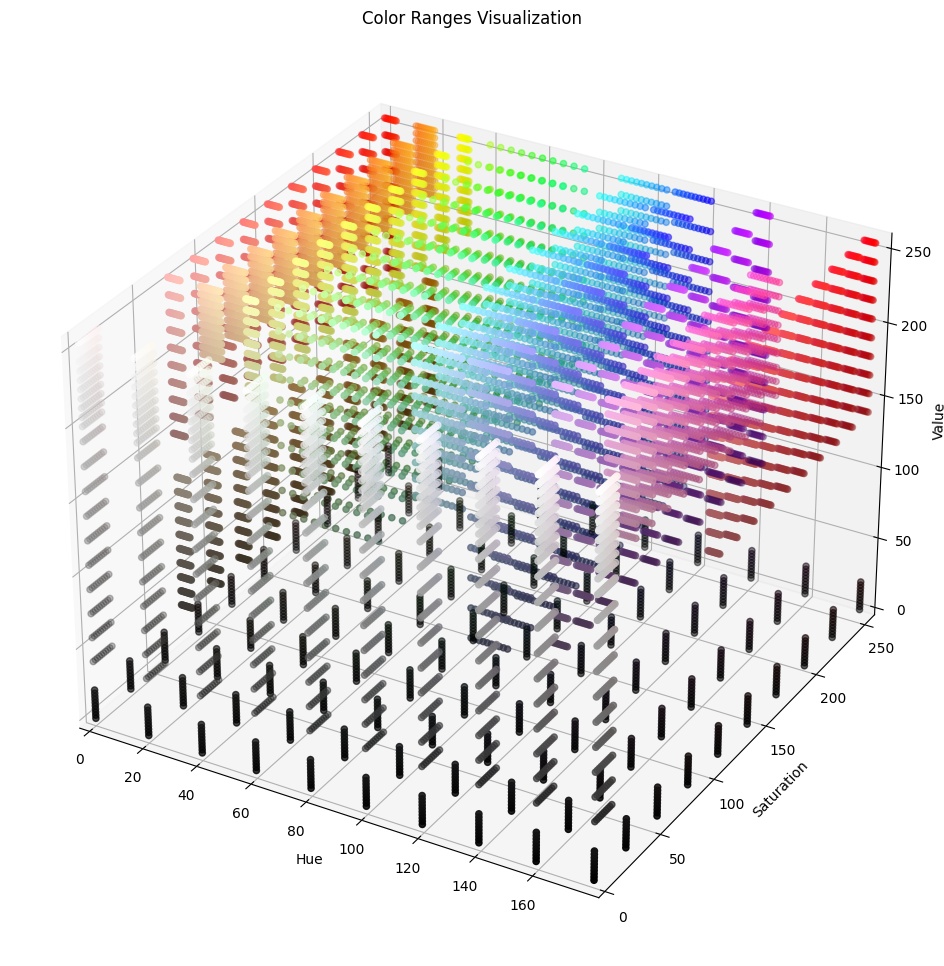

In [14]:
plot_ranges(color_limits,'scatter')

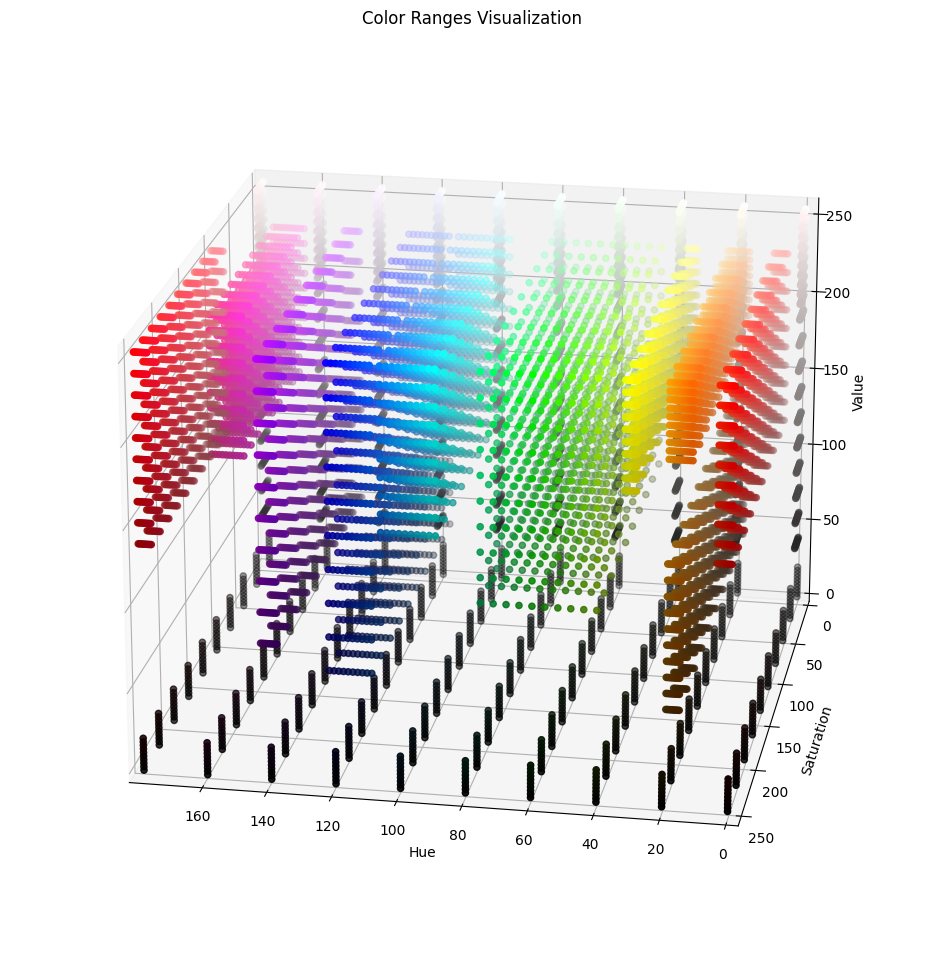

In [15]:
plot_ranges(color_limits,'scatter',20,100)

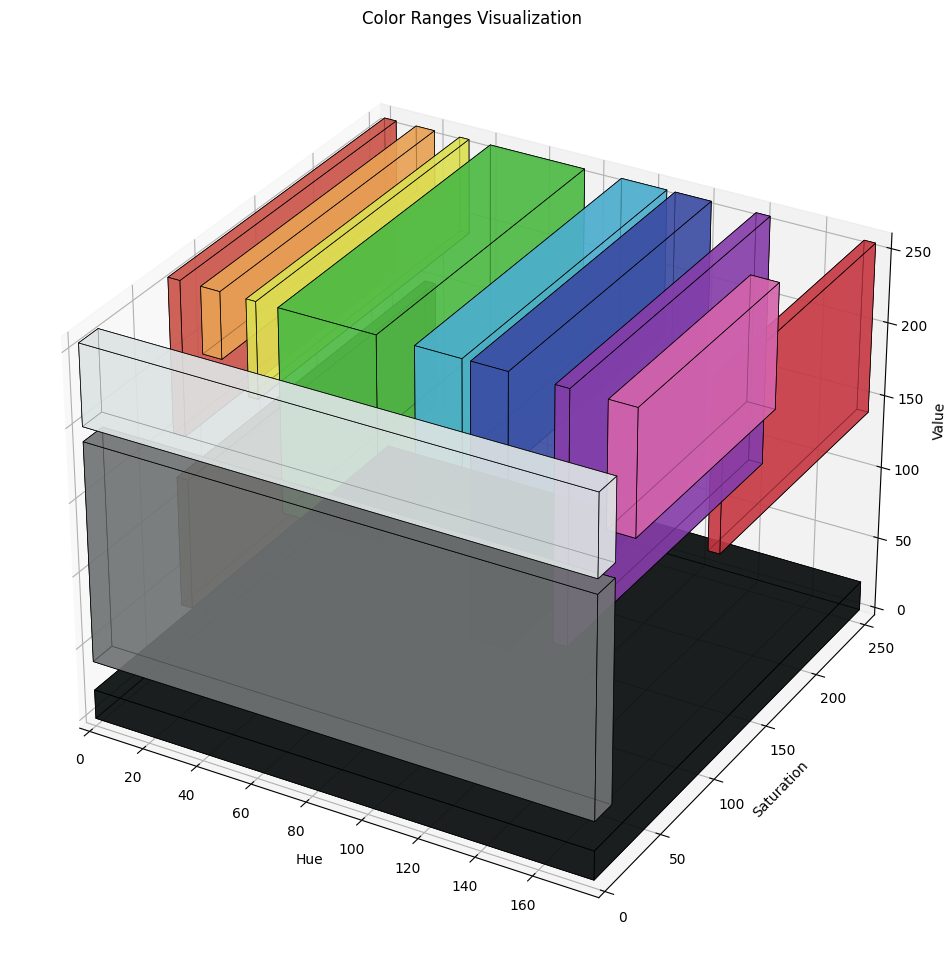

In [16]:
plot_ranges(color_limits,'cubes')

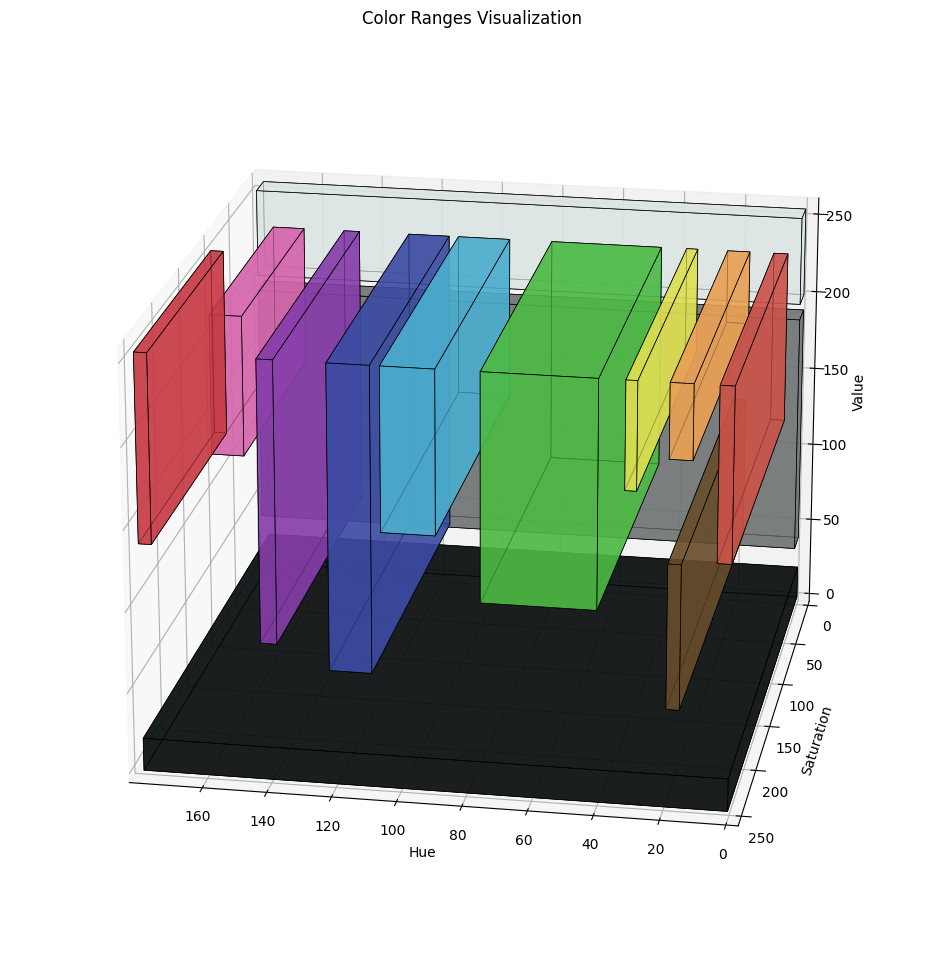

In [17]:
plot_ranges(color_limits,'cubes',20,100)

Now I want to define a function that calculate, from an HSV point, the nearest color cube in the space

In [18]:
def distance_point_to_cube(point, cube_min, cube_max):
    point = np.array(point)
    cube_min = np.array(cube_min)
    cube_max = np.array(cube_max)

    d_min = np.maximum(0, cube_min - point)
    d_max = np.maximum(0, point - cube_max)

    nearest_point = np.minimum(np.maximum(point, cube_min), cube_max)

    # If the point is inside the cube, the distance is zero
    if np.all(point >= cube_min) and np.all(point <= cube_max):
        return 0, nearest_point

    dist = np.sqrt(np.sum(np.square(d_min + d_max)))
    return dist, nearest_point

In [19]:
def nearest_color_cube(point, color_limits):
    min_distance = float('inf')
    nearest_color = None
    nearest_point_on_cube = None

    for color_name, (low, high) in color_limits.items():
        distance, nearest_point = distance_point_to_cube(point, low, high)
        if distance < min_distance:
            min_distance = distance
            nearest_color = color_name
            nearest_point_on_cube = nearest_point

    return nearest_color, min_distance, nearest_point_on_cube

In [20]:
def nearest_cube_visualization(HSV_point, color_limits):
    fig = plt.figure(figsize=(12, 12))
    ax = fig.add_subplot(111, projection='3d')

    ax.set_xlim([0, 179])
    ax.set_ylim([0, 255])
    ax.set_zlim([0, 255])

    for s, v in [(0, 0), (0, 255), (255, 0), (255, 255)]:
        ax.plot([0, 179], [s, s], [v, v], color="grey", alpha=0.3)
    for h, v in [(0, 0), (0, 255), (179, 0), (179, 255)]:
        ax.plot([h, h], [0, 255], [v, v], color="grey", alpha=0.3)
    for h, s in [(0, 0), (0, 255), (179, 0), (179, 255)]:
        ax.plot([h, h], [s, s], [0, 255], color="grey", alpha=0.3)

    nearest_color, distance, nearest_point_on_cube = nearest_color_cube(HSV_point, color_limits)

    h_normalized = HSV_point[0] / 179.0
    s_normalized = HSV_point[1] / 255.0
    v_normalized = HSV_point[2] / 255.0

    color_rgb = mcolors.hsv_to_rgb([h_normalized, s_normalized, v_normalized])
    print(color_rgb * 255)

    ax.scatter(*HSV_point, color=color_rgb, s=100, label='Input Point')

    # Plot the nearest color cube
    low, high = color_limits[nearest_color]
    h = [low[0], high[0]]
    s = [low[1], high[1]]
    v = [low[2], high[2]]

    vertices = np.array([[h[0], s[0], v[0]], [h[1], s[0], v[0]],
                         [h[1], s[1], v[0]], [h[0], s[1], v[0]],
                         [h[0], s[0], v[1]], [h[1], s[0], v[1]],
                         [h[1], s[1], v[1]], [h[0], s[1], v[1]]])

    faces = [[vertices[j] for j in [0, 1, 2, 3]], [vertices[j] for j in [4, 5, 6, 7]],
             [vertices[j] for j in [0, 1, 5, 4]], [vertices[j] for j in [2, 3, 7, 6]],
             [vertices[j] for j in [1, 2, 6, 5]], [vertices[j] for j in [4, 7, 3, 0]]]

    hsv_avg = np.mean(np.array([low, high]), axis=0) / [179, 255, 255]
    color_rgb = mcolors.hsv_to_rgb(hsv_avg)

    ax.add_collection3d(Poly3DCollection(faces, facecolors=color_rgb, linewidths=0.5, edgecolors='k', alpha=0.7))

    # Draw a line from the point to the nearest point on the cube
    ax.plot([HSV_point[0], nearest_point_on_cube[0]],
            [HSV_point[1], nearest_point_on_cube[1]],
            [HSV_point[2], nearest_point_on_cube[2]], color='black', linestyle='dashed', label=f"Distance: {distance:.2f}")

    ax.set_title(f'HSV Space with Nearest Color Cube for Point {HSV_point}')
    ax.set_xlabel('Hue')
    ax.set_ylabel('Saturation')
    ax.set_zlabel('Value')
    ax.legend()

    plt.show()

[150.          77.9658232   55.88235294]


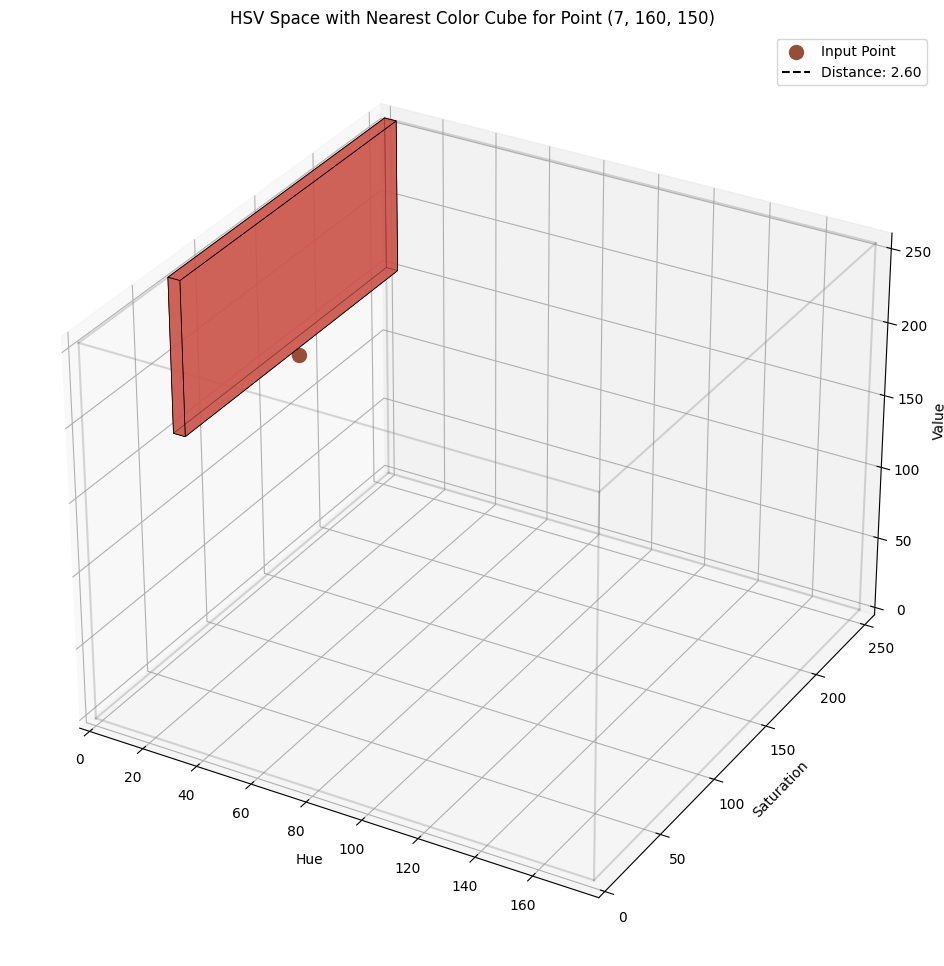

In [21]:
HSV_point = (7, 160, 150)
nearest_cube_visualization(HSV_point, color_limits)

[123.  46. 148.]


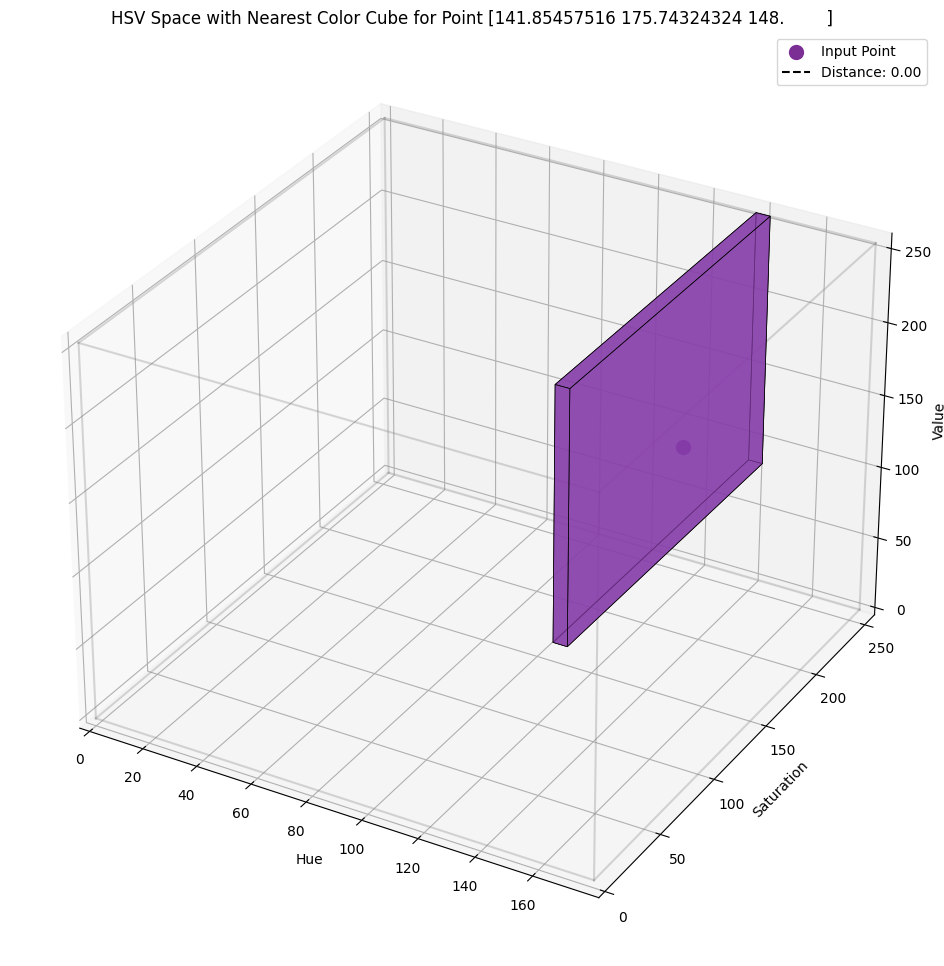

In [22]:
rgb = (123, 46, 148)
rgb_normalized = np.array(rgb) / 255.0
HSV_point_normalized = mcolors.rgb_to_hsv(rgb_normalized)
HSV_point = HSV_point_normalized * [179, 255, 255]

nearest_cube_visualization(HSV_point, color_limits)

[72.35294118 90.         77.28228722]


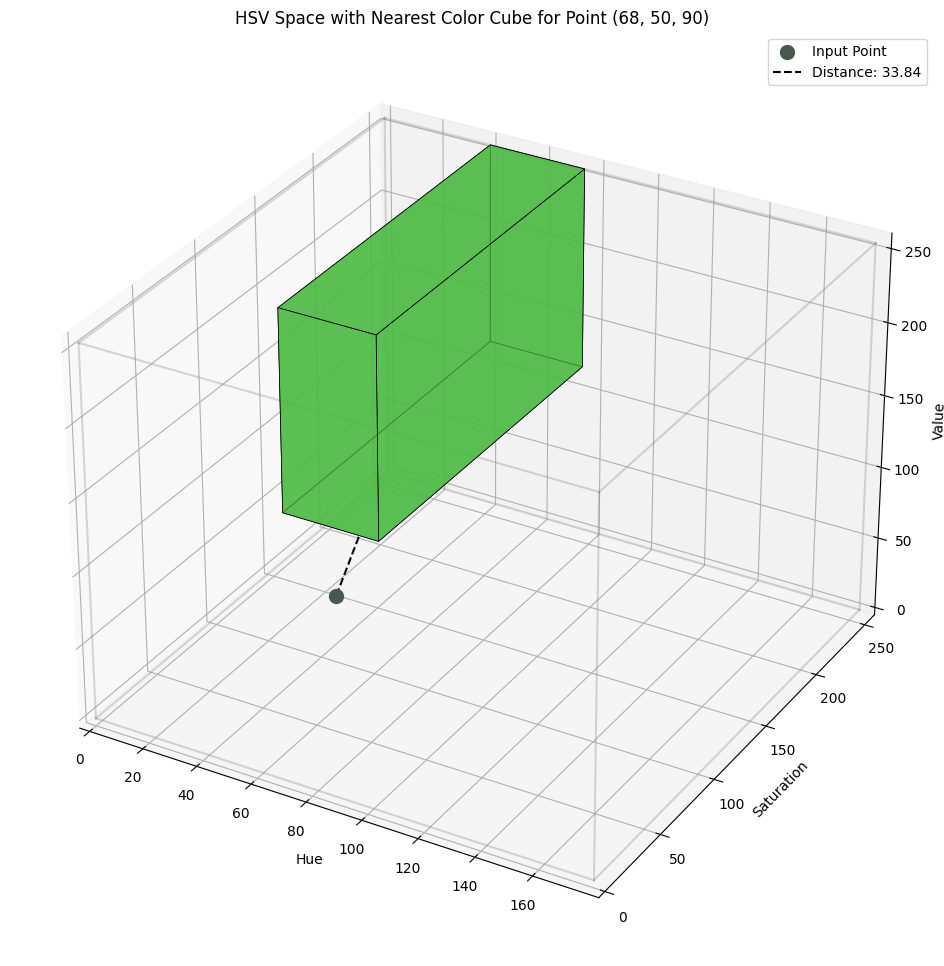

In [23]:
HSV_point = (68, 50, 90)
nearest_cube_visualization(HSV_point, color_limits)

# Mean Value

Perfect! Now I want to use the HSV hystogram to get the mean value and use it to know the nearest color! If an object is described as ***color***, the ***nearest color*** should match; The idea is also to select from the object all the pixels that are nearest to the described color, to define a better segmentation.

https://stackoverflow.com/questions/65211606/how-to-calculate-the-mean-value-from-each-channel-from-a-histogram

In [9]:
def calculate_mean_hsv(image):
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    h_hist = cv2.calcHist([hsv_image], [0], None, [180], [0, 180])
    s_hist = cv2.calcHist([hsv_image], [1], None, [256], [0, 256])
    v_hist = cv2.calcHist([hsv_image], [2], None, [256], [0, 256])

    # Total number of pixels
    total_pixels = hsv_image.shape[0] * hsv_image.shape[1]

    # Number of bins for each channel
    h_bins = np.arange(180)
    s_bins = np.arange(256)
    v_bins = np.arange(256)

    h_mean = np.sum(h_hist.flatten() * h_bins) / total_pixels
    s_mean = np.sum(s_hist.flatten() * s_bins) / total_pixels
    v_mean = np.sum(v_hist.flatten() * v_bins) / total_pixels

    return (h_mean, s_mean, v_mean)

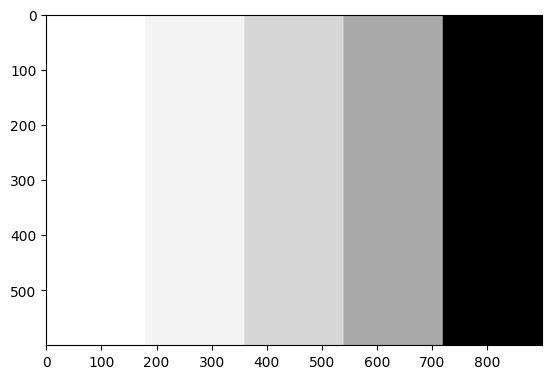

gray


In [24]:
image_path = '/content/white_shade.png'
image = cv2.imread(image_path)
mean_HSV_point = calculate_mean_hsv(image)
plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
plt.show()
print(nearest_color_cube(mean_HSV_point, color_limits)[0])

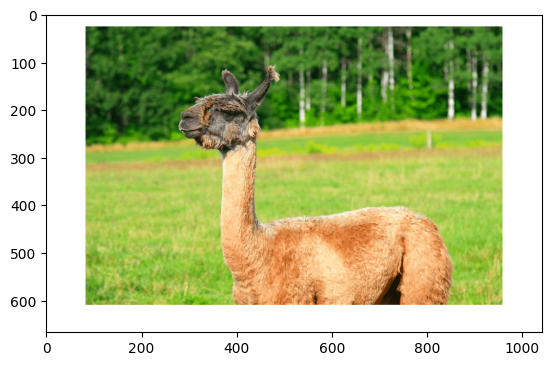

yellow


In [26]:
image_path = '/content/lama.png'
image = cv2.imread(image_path)
mean_HSV_point = calculate_mean_hsv(image)
plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
plt.show()
print(nearest_color_cube(mean_HSV_point, color_limits)[0])

[193.20638865 183.36386703 106.62374797]


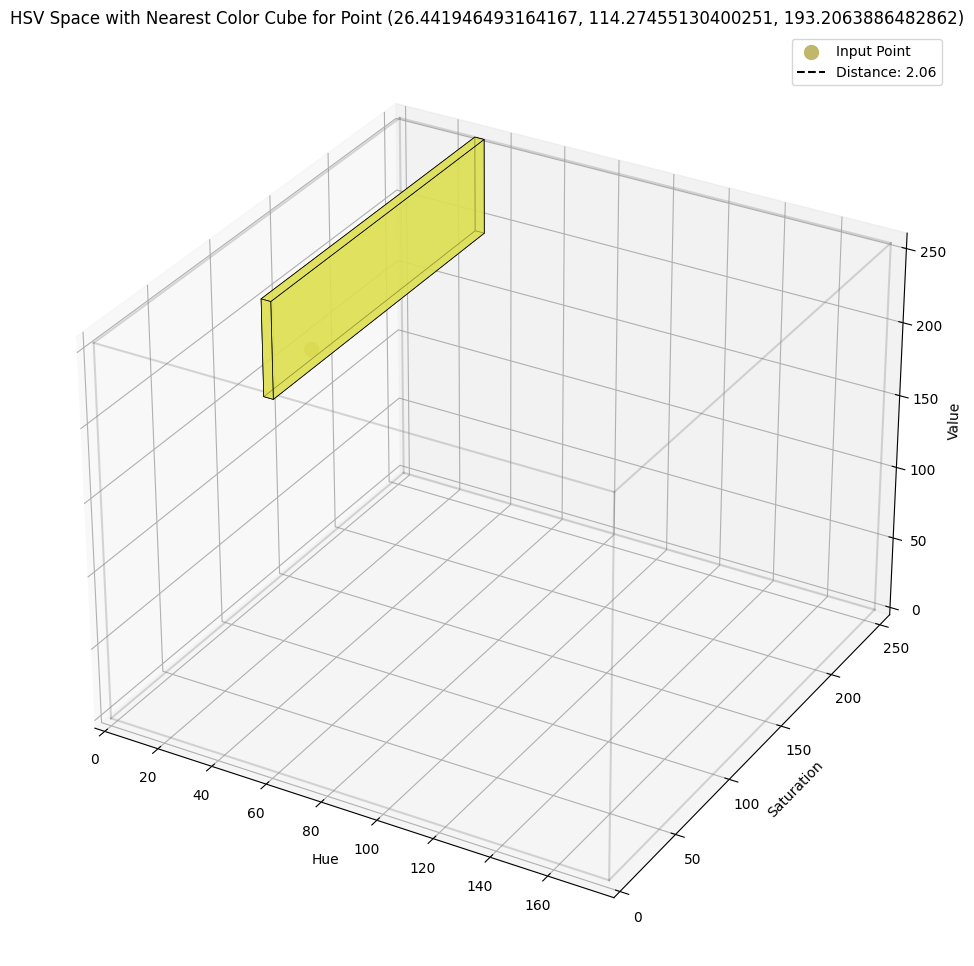

In [27]:
nearest_cube_visualization(mean_HSV_point, color_limits)

# Color Mask

Now I try to use what I studied to create a color mask

In [28]:
import cv2
import numpy as np
import time
from shapely.geometry import Polygon, mapping

def color_mask(image, color, tolerance):
    start_time = time.time()

    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    lower_bound = np.array([color_limits[color][0][0] - tolerance[0],
                            color_limits[color][0][1] - tolerance[1],
                            color_limits[color][0][2] - tolerance[2]])
    upper_bound = np.array([color_limits[color][1][0] + tolerance[0],
                            color_limits[color][1][1] + tolerance[1],
                            color_limits[color][1][2] + tolerance[2]])

    lower_bound = np.clip(lower_bound, [0, 0, 0], [179, 255, 255])
    upper_bound = np.clip(upper_bound, [0, 0, 0], [179, 255, 255])

    mask = cv2.inRange(hsv_image, lower_bound.astype(np.uint8), upper_bound.astype(np.uint8))

    end_time = time.time()

    modified_image = hsv_image.copy()

    if(color == 'white'):
      recolor = [0,0,0]
    else:
      recolor = [0,0,255]

    modified_image[mask == 0] = recolor

    print(f'Color mask processing time: {end_time - start_time}s')

    return mask, cv2.cvtColor(modified_image, cv2.COLOR_HSV2RGB)

def create_polygons_from_mask(mask):
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    polygons = []
    for c in contours:
        if len(c.reshape(-1, 2)) >= 4:
            polygons.append(Polygon(c.reshape(-1, 2)))
    return polygons

def draw_polygons(image, polygons):
    for polygon in polygons:
        exterior_coords = np.array(list(polygon.exterior.coords), dtype=np.int32)
        cv2.polylines(image, [exterior_coords], isClosed=True, color=(0, 255, 0), thickness=2)
    return image

def create_mask_from_polygons(polygons, image):
    image_shape = image.shape
    mask = np.zeros(image_shape[:2], dtype=np.uint8)

    for polygon in polygons:
        exterior_coords = np.array(list(polygon.exterior.coords), dtype=np.int32)
        cv2.fillPoly(mask, [exterior_coords], 255)

    return mask

def apply_color_to_masked_regions(image, mask, color):

    color_bgr = (color[2], color[1], color[0])

    modified_image = image.copy()
    modified_image[mask != 0] = color_bgr

    return modified_image

Color mask processing time: 0.0037813186645507812s


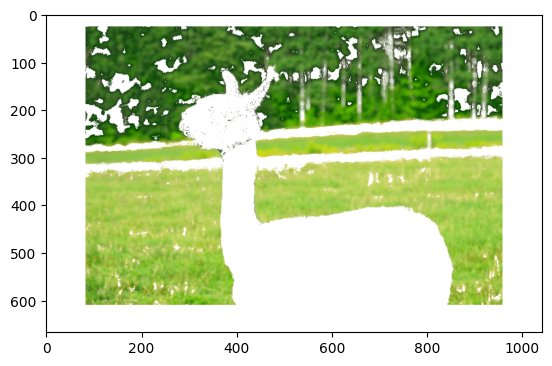

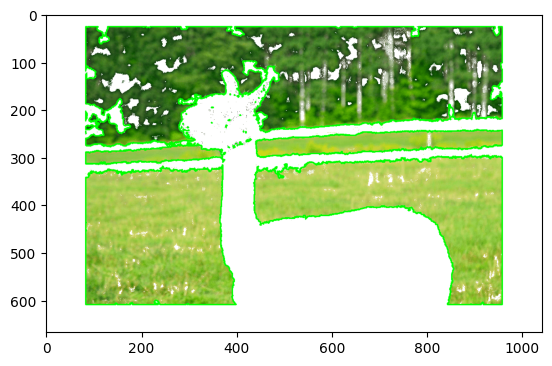

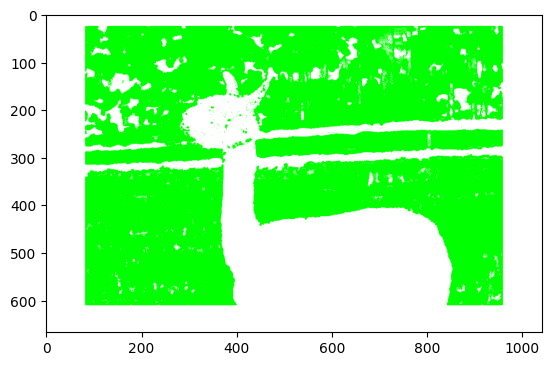

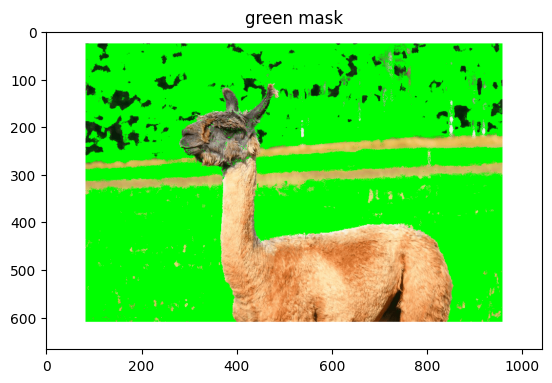

In [32]:
image_path = '/content/lama.png'
image = cv2.imread(image_path)
color = 'green'
tolerance = (10, 50, 50)

mask, hsv_image = color_mask(image, color, tolerance)

plt.imshow(hsv_image)
plt.show()

polygons = create_polygons_from_mask(mask)
image_with_polygons = draw_polygons(hsv_image, polygons)

plt.imshow(image_with_polygons)
plt.show()

create_mask_from_polygons(polygons,image)
masked_img = apply_color_to_masked_regions(image_with_polygons, mask, (0, 255, 0))

plt.imshow(masked_img)
plt.show()

masked_img = apply_color_to_masked_regions(image, mask, (0, 255, 0))
plt.imshow(cv2.cvtColor(masked_img,cv2.COLOR_BGR2RGB))
plt.title(f"{color} mask")
plt.show()

In [30]:
def color_mask_nearest_pixel(img_path, color, color_limits,tolerance):
    start_time = time.time()

    img = cv2.imread(img_path)
    hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    if color == 'white':
      result = np.ones_like(img) * 0  # Set all pixels to black
    else:
      result = np.ones_like(img) * 255  # Set all pixels to white

    for i in range(hsv_img.shape[0]):
        for j in range(hsv_img.shape[1]):
            hsv_point = hsv_img[i, j]
            nearest_color = nearest_color_cube(hsv_point, color_limits)[0]
            nearest_color_subappr =  nearest_color_cube(np.array(hsv_point)-np.array(tolerance), color_limits)[0]
            nearest_color_addappr =  nearest_color_cube(np.array(hsv_point)+np.array(tolerance), color_limits)[0]
            #print(f'Checking point : {hsv_point}, Nearest color: {nearest_color}')
            if (nearest_color == color
               or nearest_color_subappr == color
               or nearest_color_addappr == color):
                result[i, j] = img[i, j]

    end_time_ = time.time()
    print(f'{end_time_ - start_time}s')
    return result

678.836350440979s


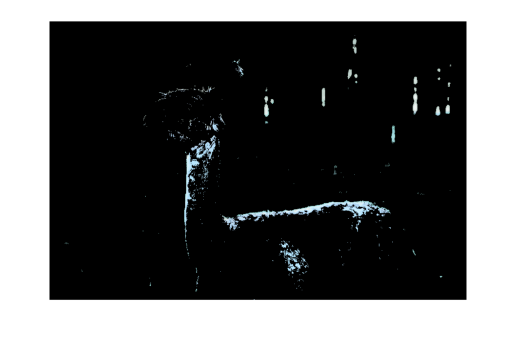

In [31]:
tolerance = [0,40,10]
result = color_mask_nearest_pixel('/content/lama.png', 'white', color_limits, tolerance)
plt.imshow(result)
plt.axis('off')
plt.show()

# Flood Fill

Now I want to create a flood fill argument to study how it would behave:

In [ ]:
import cv2
import numpy as np
from collections import deque

def flood_fill(image, start_point, tolerance):
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    start_hsv = hsv_image[start_point[1], start_point[0]]

    mask = np.zeros(hsv_image.shape[:2], dtype=np.uint8)

    lower_bound = np.clip(start_hsv - tolerance, [0, 0, 0], [179, 255, 255])
    upper_bound = np.clip(start_hsv + tolerance, [0, 0, 0], [179, 255, 255])

    queue = deque([start_point])

    directions = [(-1, -1), (-1, 0), (-1, 1), (0, -1), (0, 1), (1, -1), (1, 0), (1, 1)]

    while queue:
        x, y = queue.popleft()

        if 0 <= x < hsv_image.shape[1] and 0 <= y < hsv_image.shape[0] and mask[y, x] == 0:
            pixel_hsv = hsv_image[y, x]

            if np.all(lower_bound <= pixel_hsv) and np.all(pixel_hsv <= upper_bound):
                mask[y, x] = 255

                # Add neighbors to the queue
                for dx, dy in directions:
                    nx, ny = x + dx, y + dy
                    if 0 <= nx < hsv_image.shape[1] and 0 <= ny < hsv_image.shape[0] and mask[ny, nx] == 0:
                        queue.append((nx, ny))

    return mask

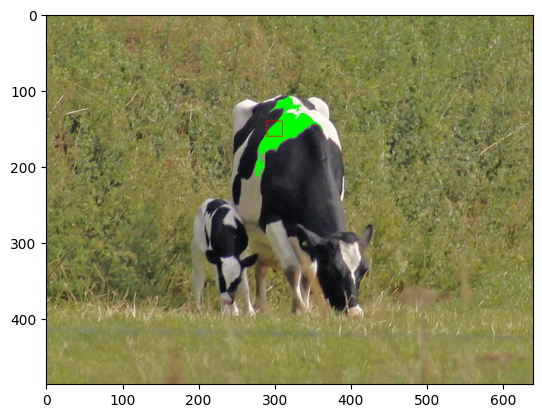

In [ ]:
start_point = (300, 150)
tolerance = np.array([179, 40, 40])

mask = flood_fill(image, start_point, tolerance)

modified_image = apply_color_to_masked_regions(image, mask, (0, 255, 0))

#Here I draw a rectangle on the point selected, comment if not needed
rectangle_size = 10
top_left = (start_point[0] - rectangle_size, start_point[1] - rectangle_size)
bottom_right = (start_point[0] + rectangle_size, start_point[1] + rectangle_size)
modified_image=cv2.rectangle(modified_image, top_left, bottom_right, (0, 0, 255), 1)

plt.imshow(cv2.cvtColor(modified_image,cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
def flood_fill_continuos(image, start_point, tolerance):
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    start_hsv = hsv_image[start_point[1], start_point[0]]

    mask = np.zeros(hsv_image.shape[:2], dtype=np.uint8)
    mask[start_point[1], start_point[0]] = 255

    queue = deque([start_point])

    directions = [(-1, -1), (-1, 0), (-1, 1), (0, -1), (0, 1), (1, -1), (1, 0), (1, 1)]

    while queue:

        x, y = queue.popleft()
        current_hsv = hsv_image[y, x]

        for dx, dy in directions:
            nx, ny = x + dx, y + dy

            # neighbor is within bounds?
            if 0 <= nx < hsv_image.shape[1] and 0 <= ny < hsv_image.shape[0] and mask[ny, nx] == 0:
                neighbor_hsv = hsv_image[ny, nx]

                lower_bound = np.clip(current_hsv - tolerance, [0, 0, 0], [179, 255, 255])
                upper_bound = np.clip(current_hsv + tolerance, [0, 0, 0], [179, 255, 255])

                # Check if the neighbor is within the tolerance bounds
                if np.all(lower_bound <= neighbor_hsv) and np.all(neighbor_hsv <= upper_bound):
                    mask[ny, nx] = 255  # Mark as visited
                    queue.append((nx, ny))

    return mask

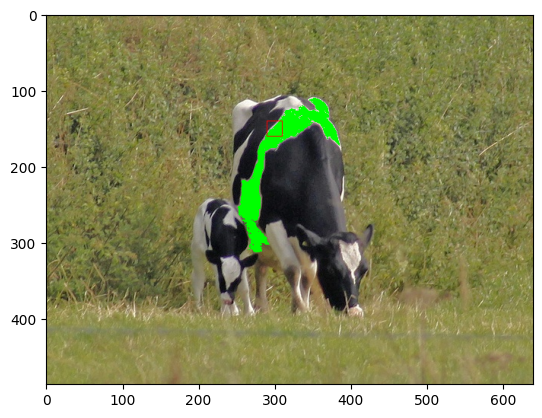

In [ ]:
image_path = '/content/train_000000529096.jpg'
image = cv2.imread(image_path)

start_point = (300, 150)
tolerance = np.array([179, 5, 5])

mask = flood_fill_continuos(image, start_point, tolerance)

modified_image = apply_color_to_masked_regions(image, mask, (0, 255, 0))

#Here I draw a rectangle on the point selected, comment if not needed
rectangle_size = 10
top_left = (start_point[0] - rectangle_size, start_point[1] - rectangle_size)
bottom_right = (start_point[0] + rectangle_size, start_point[1] + rectangle_size)
modified_image=cv2.rectangle(modified_image, top_left, bottom_right, (0, 0, 255), 1)


plt.imshow(cv2.cvtColor(modified_image,cv2.COLOR_BGR2RGB))
plt.show()

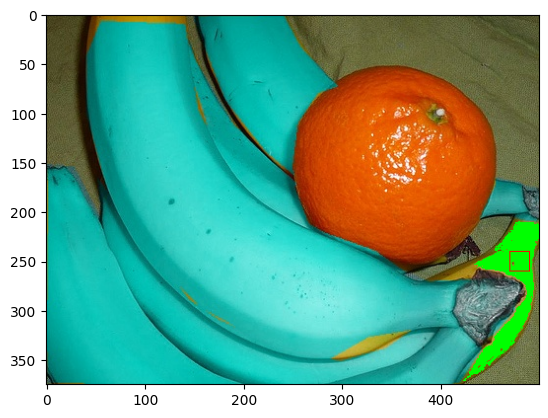

In [ ]:
image_path = '/content/banana_yellow_to_cyan_16161.jpg'
image = cv2.imread(image_path)

start_point = (480, 250)
tolerance = np.array([10, 10, 5])

mask = flood_fill_continuos(image, start_point, tolerance)

modified_image = apply_color_to_masked_regions(image, mask, (0, 255, 0))

#Here I draw a rectangle on the point selected, comment if not needed
rectangle_size = 10
top_left = (start_point[0] - rectangle_size, start_point[1] - rectangle_size)
bottom_right = (start_point[0] + rectangle_size, start_point[1] + rectangle_size)
modified_image=cv2.rectangle(modified_image, top_left, bottom_right, (0, 0, 255), 1)


plt.imshow(cv2.cvtColor(modified_image,cv2.COLOR_BGR2RGB))
plt.show()

# Color Mask + Flood Fill

Maybe I can combine the color masks and the flood fill algorithm?

In [ ]:
from random import randint
from shapely.geometry import Point
import sys

def get_random_point_in_polygon(polygon, image_shape):
    min_x, min_y, max_x, max_y = polygon.bounds
    min_x, min_y, max_x, max_y = int(min_x), int(min_y), int(max_x), int(max_y)

    x = randint(min_x, max_x)
    y = randint(min_y, max_y)

    return (x, y)

def color_flood_mask(image, polygons, color_mask,tolerance):
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    flood_mask = np.zeros(hsv_image.shape[:2], dtype=np.uint8)

    total_polygons = len(polygons)
    start_time = time.time()

    for i, polygon in enumerate(polygons):

        start_point = get_random_point_in_polygon(polygon, hsv_image.shape)
        #print(f"Random point for polygon {i + 1}: {start_point}")

        # Apply the flood fill algorithm
        mask = flood_fill(image, start_point, tolerance)
        #print(f"Mask shape: {mask.shape}, Number of non-zero pixels: {np.sum(mask > 0)}")

        # Combine the mask with the combined mask
        flood_mask = cv2.bitwise_or(flood_mask, mask)
        #print('combined mask ok')

        elapsed_time = time.time() - start_time
        estimated_total_time = (elapsed_time / (i + 1)) * total_polygons
        remaining_time = estimated_total_time - elapsed_time

        sys.stdout.write(f"\rProcessed polygon {i} of {total_polygons} - Elapsed Time: {elapsed_time:.2f}s, Estimated Remaining Time: {remaining_time:.2f}s")
        sys.stdout.flush()

    print("Processing complete.")
    return cv2.bitwise_or(color_mask, flood_mask)

Color mask processing time: 0.005886077880859375s
Processed polygon 29 of 30 - Elapsed Time: 4.32s, Estimated Remaining Time: 0.00sProcessing complete.


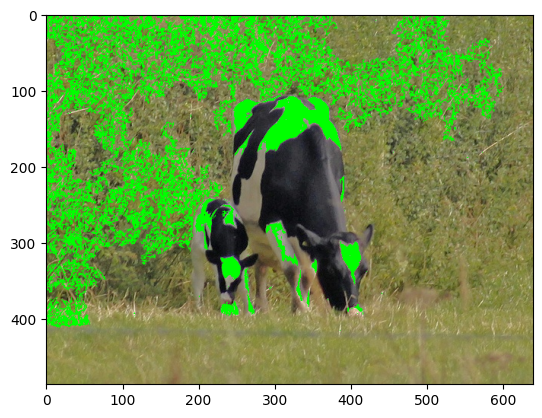

In [ ]:
color = 'white'
color_tolerance = np.array([10, 30, 40])
flood_tolerance = np.array([179,10,40])

mask, _ = color_mask(image, color, color_tolerance)
polygons = create_polygons_from_mask(mask)

combined_mask = color_flood_mask(image, polygons,mask,flood_tolerance)

modified_image = apply_color_to_masked_regions(image, combined_mask, (0, 255, 0))

plt.imshow(cv2.cvtColor(modified_image,cv2.COLOR_BGR2RGB))
plt.show()

# Mean Value + Color Mask

In [ ]:
def color_mask_from_value(image, color, tolerance):
    start_time = time.time()

    # Read image
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    lower_bound = np.array([color[0] - tolerance[0],
                            color[1] - tolerance[1],
                            color[2] - tolerance[2]])
    upper_bound = np.array([color[0] + tolerance[0],
                            color[1] + tolerance[1],
                            color[2] + tolerance[2]])

    # Clip values to valid HSV range
    lower_bound = np.clip(lower_bound, [0, 0, 0], [179, 255, 255])
    upper_bound = np.clip(upper_bound, [0, 0, 0], [179, 255, 255])

    mask = cv2.inRange(hsv_image, lower_bound.astype(np.uint8), upper_bound.astype(np.uint8))

    end_time = time.time()

    modified_image = hsv_image.copy()

    if(color == 'white'):
      recolor = [0,0,0]
    else:
      recolor = [0,0,255]

    modified_image[mask == 0] = recolor

    print(f'Color mask processing time: {end_time - start_time}s')

    return mask, cv2.cvtColor(modified_image, cv2.COLOR_HSV2RGB)

Color mask processing time: 0.010038375854492188s


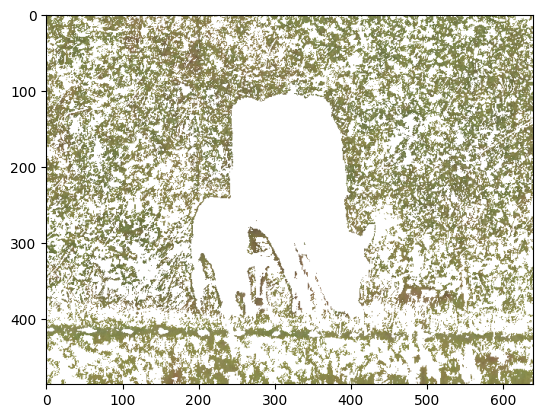

In [ ]:
image_path = '/content/train_000000529096.jpg'
image = cv2.imread(image_path)

mean_HSV_point = calculate_mean_hsv(image)

tolerance = [20,20,20]
img = color_mask_from_value(image, mean_HSV_point, tolerance)[1]

plt.imshow(img)
plt.show()

# Using Coco Segmentation

In this case the cow is black and white, so if I calculate the mean value in the cow segmentation I should find a mean value of gray , which is not good in terms of segmenting the right color:

In [ ]:
!wget http://images.cocodataset.org/annotations/annotations_trainval2017.zip -O coco_ann2017.zip

--2024-07-28 16:05:42--  http://images.cocodataset.org/annotations/annotations_trainval2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 3.5.21.193, 3.5.9.180, 52.217.117.41, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|3.5.21.193|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 252907541 (241M) [application/zip]
Saving to: ‘coco_ann2017.zip’

coco_ann2017.zip    100%[===================>] 241.19M  18.0MB/s    in 15s     

2024-07-28 16:05:57 (15.9 MB/s) - ‘coco_ann2017.zip’ saved [252907541/252907541]

--2024-07-28 16:05:57--  http://images.cocodataset.org/zips/train2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 52.216.53.241, 54.231.196.129, 52.217.167.9, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|52.216.53.241|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 19336861798 (18G) [application/zip]
Saving to: ‘coco_val2017.zip’

coco_val2017.zip      0%[ 

In [ ]:
from zipfile import ZipFile, BadZipFile
import os

def extract_zip_file(extract_path):
    try:
        with ZipFile(extract_path+".zip") as zfile:
            zfile.extractall(extract_path)

        # remove zipfile
        zfileTOremove=f"{extract_path}"+".zip"
        if os.path.isfile(zfileTOremove):
            os.remove(zfileTOremove)

    except BadZipFile as e:
        print("Error:", e)

extract_ann_path="./coco_ann2017"
extract_zip_file(extract_ann_path)

In [ ]:
from pycocotools.coco import COCO
from pycocotools import mask as maskUtils

def get_masks(img_id, category_name, ann_file):
    coco = COCO(ann_file)
    cat_ids = coco.getCatIds(catNms=[category_name])
    ann_ids = coco.getAnnIds(imgIds=[img_id], catIds=cat_ids)
    anns = coco.loadAnns(ann_ids)
    mask = np.zeros((coco.imgs[img_id]['height'], coco.imgs[img_id]['width']), dtype=np.uint8)

    for ann in anns:
        mask = np.maximum(mask, coco.annToMask(ann))

    return mask

In [ ]:
def mean_hsv_mask(image, mask):
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    masked_hsv = cv2.bitwise_and(hsv_image, hsv_image, mask=mask)

    plt.imshow(cv2.cvtColor(masked_hsv, cv2.COLOR_HSV2RGB))
    plt.show()

    # considering just masked pixels
    h_hist = cv2.calcHist([masked_hsv], [0], mask, [180], [0, 180])
    s_hist = cv2.calcHist([masked_hsv], [1], mask, [256], [0, 256])
    v_hist = cv2.calcHist([masked_hsv], [2], mask, [256], [0, 256])

    total_pixels = np.sum(mask > 0)

    if total_pixels == 0:
        return (0, 0, 0)

    h_bins = np.arange(180)
    s_bins = np.arange(256)
    v_bins = np.arange(256)

    h_mean = np.sum(h_hist.flatten() * h_bins) / total_pixels
    s_mean = np.sum(s_hist.flatten() * s_bins) / total_pixels
    v_mean = np.sum(v_hist.flatten() * v_bins) / total_pixels

    return (h_mean, s_mean, v_mean)

loading annotations into memory...
Done (t=26.12s)
creating index...
index created!


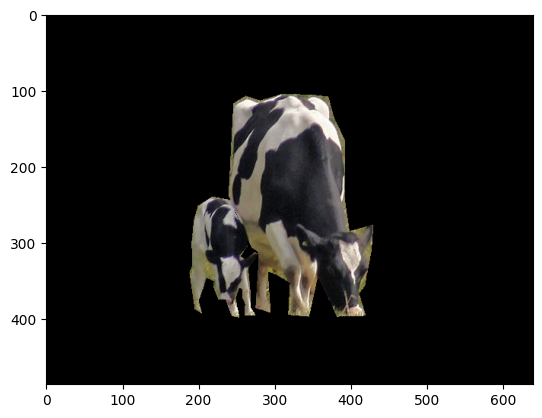

In [ ]:
ann_file = "./coco_ann2017/annotations/instances_train2017.json"
img_id = 529096
category_name = "cow"
image_path = '/content/train_000000529096.jpg'
image = cv2.imread(image_path)

mask = get_masks(img_id, category_name, ann_file)
mean_HSV_point = mean_hsv_mask(image, mask)

gray
Color mask processing time: 0.008688211441040039s


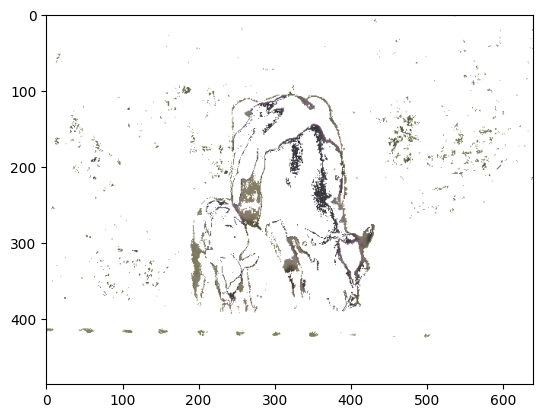

[80.30811523 99.30271343 86.74871478]


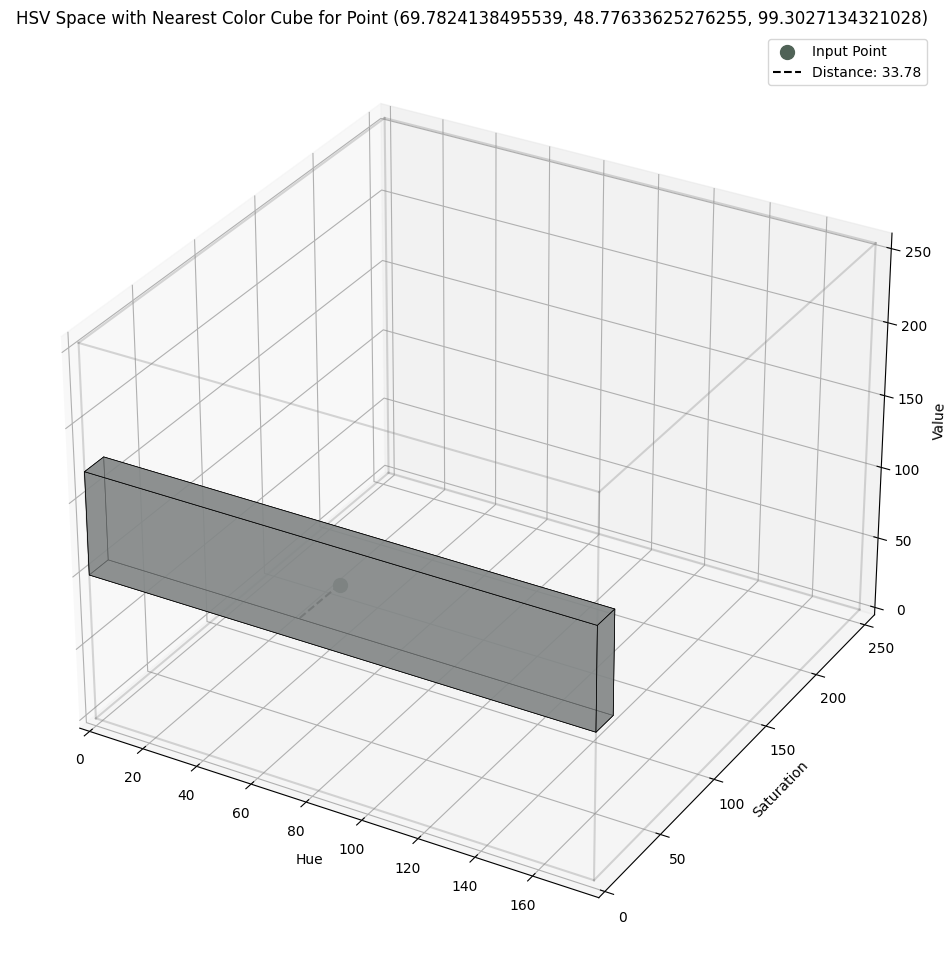

In [ ]:
print(nearest_color_cube(mean_HSV_point, color_limits)[0])
tolerance = [179,30,40]
img = color_mask_from_value(image, mean_HSV_point, tolerance)[1]

plt.imshow(img)
plt.show()

nearest_cube_visualization(mean_HSV_point, color_limits)

In [ ]:
def color_mask_inmask(image, mask, color, tolerance):
    start_time = time.time()

    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    lower_bound = np.array([color_limits[color][0][0] - tolerance[0],
                            color_limits[color][0][1] - tolerance[1],
                            color_limits[color][0][2] - tolerance[2]])
    upper_bound = np.array([color_limits[color][1][0] + tolerance[0],
                            color_limits[color][1][1] + tolerance[1],
                            color_limits[color][1][2] + tolerance[2]])

    lower_bound = np.clip(lower_bound, [0, 0, 0], [179, 255, 255])
    upper_bound = np.clip(upper_bound, [0, 0, 0], [179, 255, 255])

    #Here I search just inside the Coco mask
    masked_hsv_image = cv2.bitwise_and(hsv_image, hsv_image, mask=mask)

    color_mask = cv2.inRange(masked_hsv_image, lower_bound.astype(np.uint8), upper_bound.astype(np.uint8))

    end_time = time.time()

    modified_image = hsv_image.copy()
    recolor = [0, 0, 255] if color != 'white' else [0, 0, 0]

    modified_image[color_mask == 0] = recolor

    print(f'Color mask processing time: {end_time - start_time}s')

    return color_mask, cv2.cvtColor(modified_image, cv2.COLOR_HSV2RGB)

In [ ]:
def apply_color_to_masked_regions_inmask(image, color_mask, segm_mask, color):

    color_bgr = (color[2], color[1], color[0])
    combine_mask = cv2.bitwise_and(color_mask, segm_mask)

    modified_image = image.copy()
    modified_image[combine_mask != 0] = color_bgr

    return modified_image

In [ ]:
def color_flood_mask_continuos(image, polygons, color_mask,tolerance):
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    flood_mask = np.zeros(hsv_image.shape[:2], dtype=np.uint8)

    total_polygons = len(polygons)
    start_time = time.time()

    for i, polygon in enumerate(polygons):

        start_point = get_random_point_in_polygon(polygon, hsv_image.shape)
        #print(f"Random point for polygon {i + 1}: {start_point}")

        # Apply the flood fill algorithm
        mask = flood_fill_continuos(image, start_point, tolerance)
        #print(f"Mask shape: {mask.shape}, Number of non-zero pixels: {np.sum(mask > 0)}")

        # Combine the mask with the combined mask
        flood_mask = cv2.bitwise_or(flood_mask, mask)
        #print('combined mask ok')

        elapsed_time = time.time() - start_time
        estimated_total_time = (elapsed_time / (i + 1)) * total_polygons
        remaining_time = estimated_total_time - elapsed_time

        sys.stdout.write(f"\rProcessed polygon {i} of {total_polygons} - Elapsed Time: {elapsed_time:.2f}s, Estimated Remaining Time: {remaining_time:.2f}s")
        sys.stdout.flush()

    print("Processing complete.")
    return cv2.bitwise_or(color_mask, flood_mask)

loading annotations into memory...
Done (t=23.88s)
creating index...
index created!
Color mask processing time: 0.0023071765899658203s


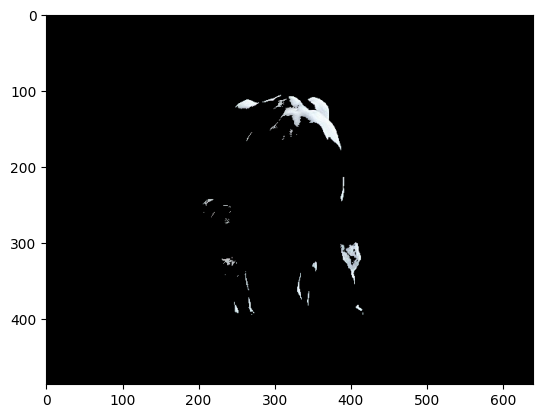

Processed polygon 21 of 22 - Elapsed Time: 0.82s, Estimated Remaining Time: 0.00sProcessing complete.


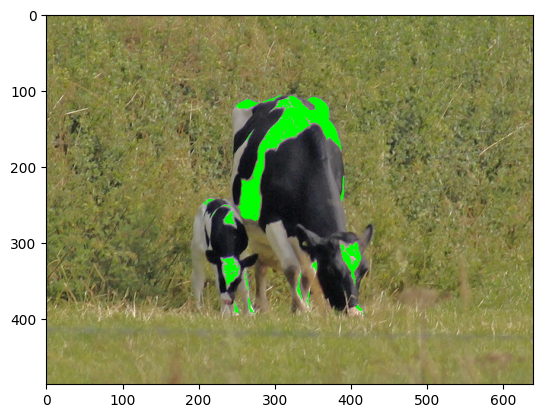

In [ ]:
color = 'white'
color_tolerance = np.array([179, 20, 20])
flood_tolerance = np.array([179,5,3])

img_id = 529096
category_name = "cow"
ann_file = "./coco_ann2017/annotations/instances_train2017.json"

image_path = '/content/train_000000529096.jpg'
image = cv2.imread(image_path)

mask = get_masks(img_id, category_name, ann_file)

color_mask, _ = color_mask_inmask(image,mask, color, color_tolerance)

plt.imshow(cv2.cvtColor(_,cv2.COLOR_BGR2RGB))
plt.show()

polygons = create_polygons_from_mask(color_mask)

combined_mask = color_flood_mask_continuos(image, polygons,color_mask,flood_tolerance)

modified_image = apply_color_to_masked_regions_inmask(image, combined_mask, mask, (0, 255, 0))

plt.imshow(cv2.cvtColor(modified_image,cv2.COLOR_BGR2RGB))
plt.show()

# Camera Experiments

In [ ]:
def get_limits(color):

    lowerLimit = color_limits[color][0]
    upperLimit = color_limits[color][1]

    return lowerLimit, upperLimit

def recolor(img, mask, original_color, color):
  original_image = img.copy()
  modified_image = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

  lowerLimit, upperLimit = get_limits(original_color)
  original_range = {'lower': lowerLimit,'upper': upperLimit}
  lowerLimit, upperLimit = get_limits(color)
  new_range = {'lower': lowerLimit,'upper': upperLimit}

  for i in [0,1,2]:

      if i == 1 and (color == 'yellow' or color == 'orange'): #for now
        break

      if i== 2 and color == 'white':  #for now
        break

      channel = modified_image[:, :, i]
      current_hue_values = channel.copy()

      original_range_width = original_range['upper'][i] - original_range['lower'][i]
      new_range_width = new_range['upper'][i] - new_range['lower'][i]

      if original_range_width == 0 or new_range_width == 0:
          continue

      new_hue_values = (current_hue_values - original_range['lower'][i]) * (original_range_width/new_range_width) +  new_range['lower'][i]
      new_hue_values = np.clip(new_hue_values, new_range['lower'][i], new_range['upper'][i])

      channel[mask > 0] = new_hue_values.flatten()[mask.flatten() > 0].reshape(channel[mask > 0].shape)
      modified_image[:, :, i] = channel

  modified_image = cv2.cvtColor(modified_image, cv2.COLOR_HSV2RGB)

  return modified_image

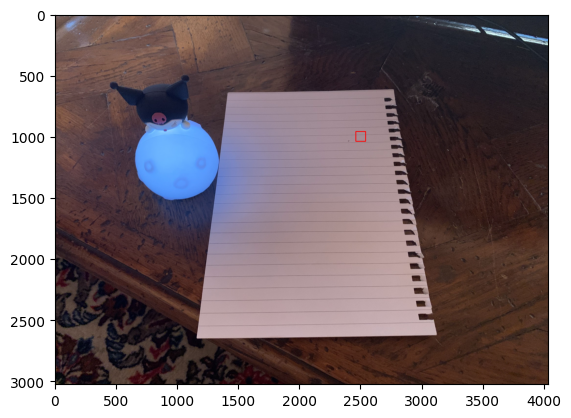

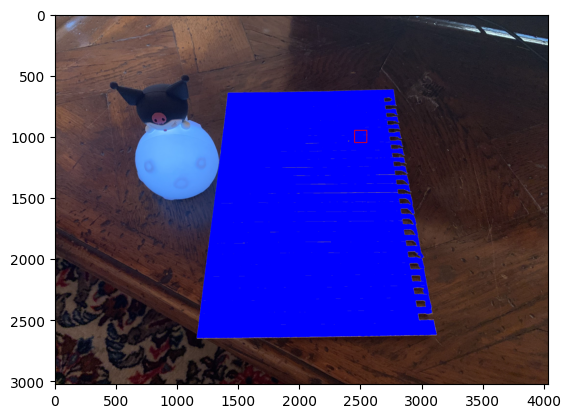

In [ ]:
image_path = '/content/colored_light_effect.jpg'
image = cv2.imread(image_path)

#Here I draw a rectangle on the point selected, comment if not needed
rectangle_size = 40
top_left = (start_point[0] - rectangle_size, start_point[1] - rectangle_size)
bottom_right = (start_point[0] + rectangle_size, start_point[1] + rectangle_size)
rec_image = image.copy()
rec_image=cv2.rectangle(rec_image, top_left, bottom_right, (0, 0, 255), 5)

plt.imshow(cv2.cvtColor(rec_image,cv2.COLOR_BGR2RGB))
plt.show()

start_point = (2500,1000)
tolerance = np.array([179, 5, 5])

mask = flood_fill_continuos(image, start_point, tolerance)

modified_image = apply_color_to_masked_regions(image, mask, (0, 0 , 255))

#Here I draw a rectangle on the point selected, comment if not needed
rectangle_size = 50
top_left = (start_point[0] - rectangle_size, start_point[1] - rectangle_size)
bottom_right = (start_point[0] + rectangle_size, start_point[1] + rectangle_size)
modified_image=cv2.rectangle(modified_image, top_left, bottom_right, (0, 0, 255), 5)


plt.imshow(cv2.cvtColor(modified_image,cv2.COLOR_BGR2RGB))
plt.show()

Color mask processing time: 0.158097505569458s


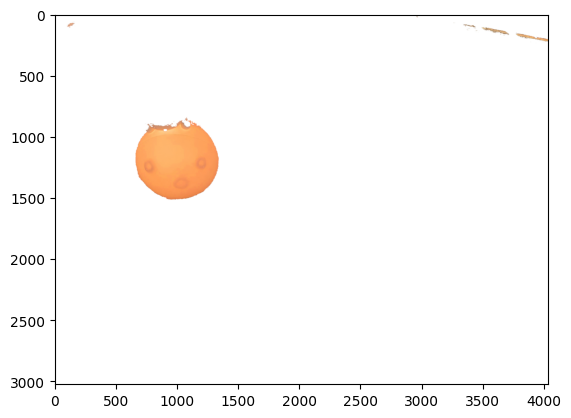

In [ ]:
image_path = '/content/colored_light_effect.jpg'
image = cv2.imread(image_path)

tolerance = np.array([5, 5, 5])

colored_mask, _= color_mask(image, 'cyan', tolerance)

plt.imshow(cv2.cvtColor(_,cv2.COLOR_BGR2RGB))
plt.show()

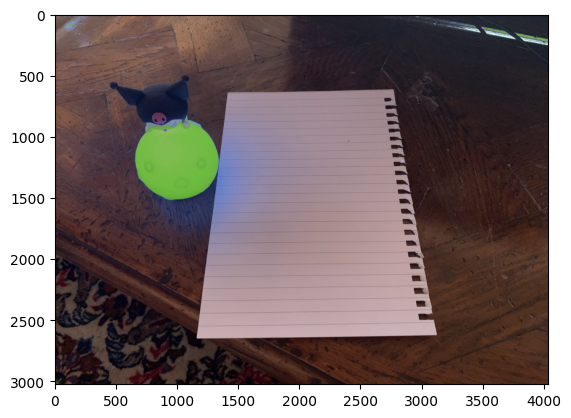

In [ ]:
recolored = recolor(image, colored_mask, 'cyan', 'green')
plt.imshow(recolored)
plt.show()

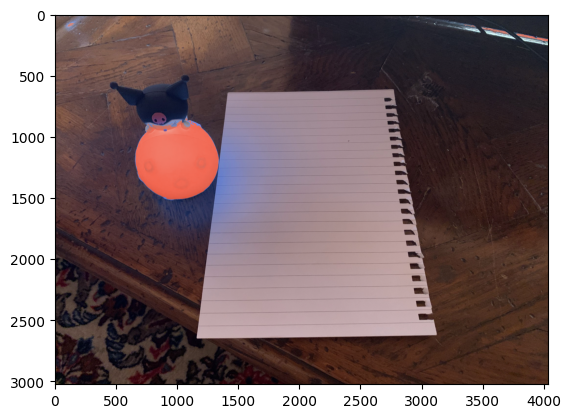

In [ ]:
recolored = recolor(image, colored_mask, 'cyan', 'red')
plt.imshow(recolored)
plt.show()

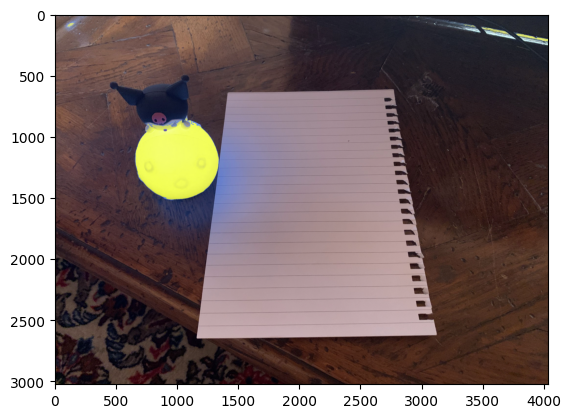

In [ ]:
recolored = recolor(image, colored_mask, 'cyan', 'yellow')
plt.imshow(recolored)
plt.show()

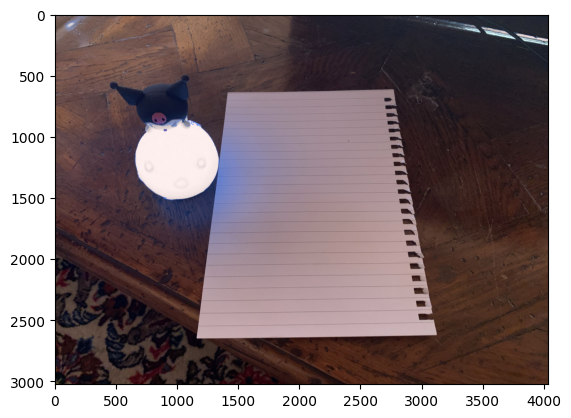

In [ ]:
recolored = recolor(image, colored_mask, 'cyan', 'white')
plt.imshow(recolored)
plt.show()

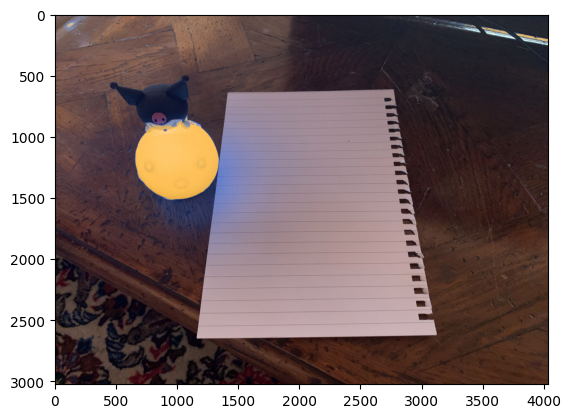

In [ ]:
recolored = recolor(image, colored_mask, 'cyan', 'orange')
plt.imshow(recolored)
plt.show()

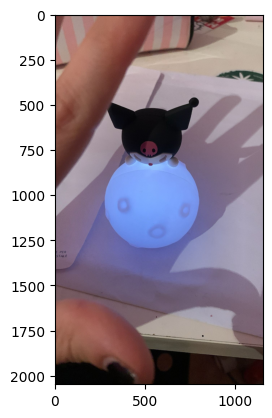

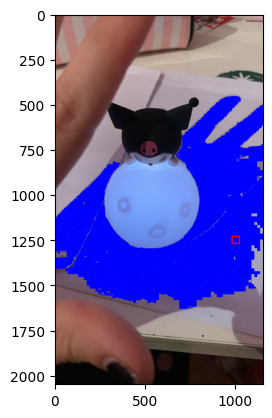

In [ ]:
image_path = '/content/shadow_effect.jpg'
image = cv2.imread(image_path)

#Here I draw a rectangle on the point selected, comment if not needed
rectangle_size = 20
top_left = (start_point[0] - rectangle_size, start_point[1] - rectangle_size)
bottom_right = (start_point[0] + rectangle_size, start_point[1] + rectangle_size)
rec_image = image.copy()
rec_image=cv2.rectangle(rec_image, top_left, bottom_right, (0, 0, 255), 5)

plt.imshow(cv2.cvtColor(rec_image,cv2.COLOR_BGR2RGB))
plt.show()

start_point = (1000,1250)
tolerance = np.array([3, 2, 4])

mask = flood_fill_continuos(image, start_point, tolerance)

modified_image = apply_color_to_masked_regions(image, mask, (0, 0 , 255))

#Here I draw a rectangle on the point selected, comment if not needed
rectangle_size = 20
top_left = (start_point[0] - rectangle_size, start_point[1] - rectangle_size)
bottom_right = (start_point[0] + rectangle_size, start_point[1] + rectangle_size)
modified_image=cv2.rectangle(modified_image, top_left, bottom_right, (0, 0, 255), 5)


plt.imshow(cv2.cvtColor(modified_image,cv2.COLOR_BGR2RGB))
plt.show()

Color mask processing time: 0.01762080192565918s


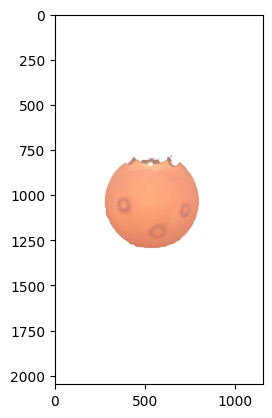

In [ ]:
image_path = '/content/shadow_effect.jpg'
image = cv2.imread(image_path)

color_mask, _ = color_mask(image, 'cyan', np.array([10, 30, 40]))

plt.imshow(cv2.cvtColor(_,cv2.COLOR_BGR2RGB))
plt.show()

# Edge Detection

https://learnopencv.com/edge-detection-using-opencv/

In [ ]:
import cv2

def SobelEdgeDetection(img):
  # Convert to graycsale
  img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  # Blur the image for better edge detection
  img_blur = cv2.GaussianBlur(img_gray, (3,3), 0)

  sobelx = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=1, dy=0, ksize=5) # Sobel Edge Detection on the X axis
  sobely = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=0, dy=1, ksize=5) # Sobel Edge Detection on the Y axis
  sobelxy = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=1, dy=1, ksize=5) # Combined X and Y Sobel Edge Detection

  return sobelxy

def CannyEdgeDetection(img):
  # Convert to graycsale
  img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  # Blur the image for better edge detection
  img_blur = cv2.GaussianBlur(img_gray, (3,3), 0)
  edges = cv2.Canny(image=img_blur, threshold1=100, threshold2=200) # Canny Edge Detection

  return edges

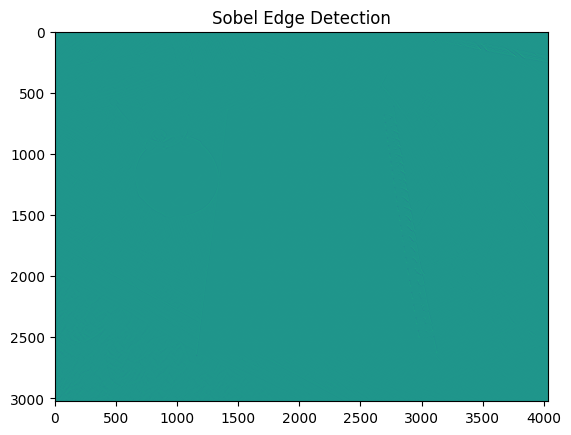

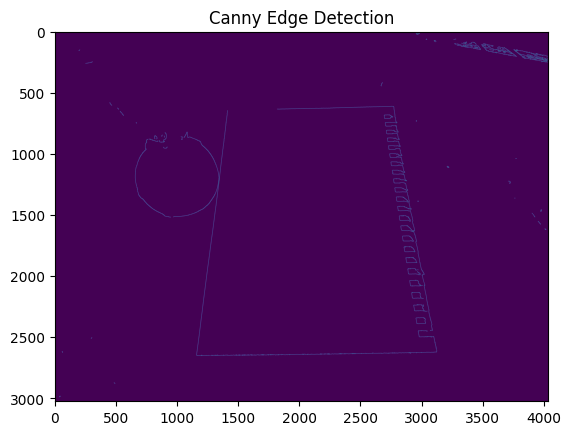

In [ ]:
img = cv2.imread('colored_light_effect.jpg')

# Sobel Edge Detection
sobelxy = SobelEdgeDetection(img)
plt.imshow(sobelxy)
plt.title('Sobel Edge Detection')
plt.show()

# Canny Edge Detection
edges = CannyEdgeDetection(img)
plt.imshow(edges)
plt.title('Canny Edge Detection')
plt.show()

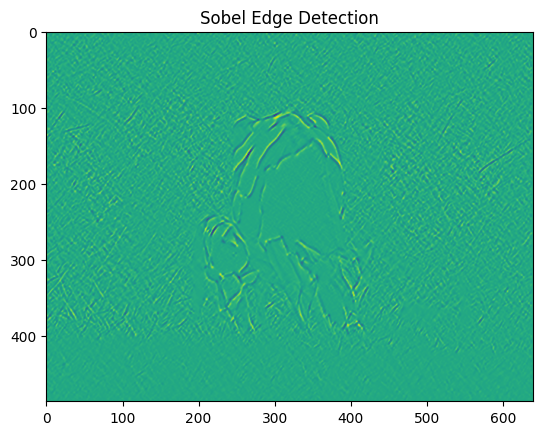

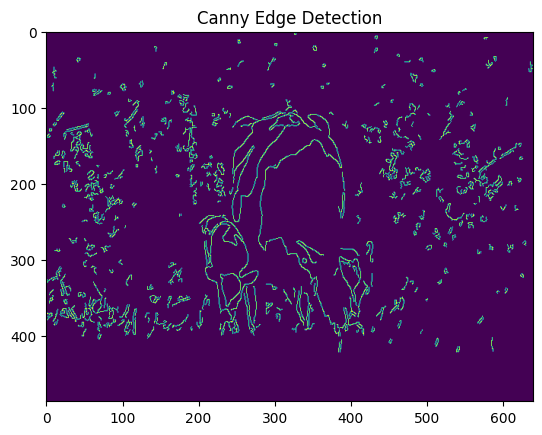

In [ ]:
img = cv2.imread('/content/train_000000529096.jpg')

# Sobel Edge Detection
sobelxy = SobelEdgeDetection(img)
plt.imshow(sobelxy)
plt.title('Sobel Edge Detection')
plt.show()

# Canny Edge Detection
edges = CannyEdgeDetection(img)
plt.imshow(edges)
plt.title('Canny Edge Detection')
plt.show()